Open this link to see the complete code and outputs.<br>
https://nbviewer.jupyter.org/github/aymmtok/Analysis-Practice/blob/master/COVID_19_Analysis.ipynb

***

# COVID_19 Analysis as of Mar. 12, 2020

<li> Coronaviruses are zoonotic viruses (means transmitted between animals and people.)
<li> Symptoms include from fever, cough, respiratory symptoms, and breathing difficulties.
<li> In severe cases, it can cuase pneumonia, SARS, kidney failure and even death

## COVID-19
<li> Caused by a SARS-COV-2 corona virus
<li> First identified in Wuhan, Hubei, China
<li> Eariliest reported symptoms occurred on 1 December 2019.
<li> On 30 January, the WHO declared the outbreak to be a Public Health Emergency of International Concern

In [139]:
! pip install calmap

In [140]:
import json
import random
from urllib.request import urlopen

import numpy as np
import pandas as pd

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import folium

# color pallette
cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

# converter 
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# html embedding
from IPython.display import Javascript
from IPython.core.display import display, HTML

# Dataset

### The file contains the cumulative count of confirmed, death and recovered cases of COVID-19 from different countries from 22nd January 2020.

In [36]:
full_table = pd.read_csv('covid_19_clean_complete.csv', parse_dates=['Date'])
full_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Thailand,15.0000,101.0000,2020-01-22,2,0,0
1,NaN,Japan,36.0000,138.0000,2020-01-22,2,0,0
2,NaN,Singapore,1.2833,103.8333,2020-01-22,0,0,0
3,NaN,Nepal,28.1667,84.2500,2020-01-22,0,0,0
4,NaN,Malaysia,2.5000,112.5000,2020-01-22,0,0,0


In [37]:
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10965 entries, 0 to 10964
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  5457 non-null   object        
 1   Country/Region  10965 non-null  object        
 2   Lat             10965 non-null  float64       
 3   Long            10965 non-null  float64       
 4   Date            10965 non-null  datetime64[ns]
 5   Confirmed       10965 non-null  int64         
 6   Deaths          10965 non-null  int64         
 7   Recovered       10965 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 685.4+ KB


# Preprocessing

## Cleaning Data

In [38]:
# cases
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']

# Active case = confirmed - deaths - recovered
full_table['Active'] = full_table['Confirmed'] - full_table['Deaths'] - full_table['Recovered']

# replacing Mainland China with just China
full_table['Country/Region'] = full_table['Country/Region'].replace('Mainland China', 'China')

# filling missing values with NA
full_table['Province/State'] = full_table['Province/State'].fillna('NA')

full_table[cases] = full_table[cases].fillna(0)
full_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,NA,Thailand,15.0000,101.0000,2020-01-22,2,0,0,2
1,NA,Japan,36.0000,138.0000,2020-01-22,2,0,0,2
2,NA,Singapore,1.2833,103.8333,2020-01-22,0,0,0,0
3,NA,Nepal,28.1667,84.2500,2020-01-22,0,0,0,0
4,NA,Malaysia,2.5000,112.5000,2020-01-22,0,0,0,0


## Derived Tables

In [43]:
# cases in the ship
ship = full_table[full_table['Province/State'].str.contains('Grand Princess')|
                 full_table['Country/Region'].str.contains('Cruise Ship')]
# ship = full_table[full_table['Province/State'].str.contains('Grand Princess')|
#                  full_table['Province/State'].str.contains('Diamond Princess')]

# china and the row
china = full_table[full_table['Country/Region'] == 'China']
row = full_table[full_table['Country/Region'] != 'China']

# latest data
full_latest = full_table[full_table['Date'] == max(full_table['Date'])].reset_index()
china_latest = full_latest[full_latest['Country/Region'] == 'China']
row_latest = full_latest[full_latest['Country/Region'] != 'China']

# latest condensed
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered',
                                                           'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered',
                                                             'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered',
                                                         'Active'].sum().reset_index()

In [44]:
ship

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
105,Grand Princess,US,37.6489,-122.6655,2020-01-22,0,0,0,0
167,Diamond Princess,Cruise Ship,35.4437,139.6380,2020-01-22,0,0,0,0
320,Grand Princess,US,37.6489,-122.6655,2020-01-23,0,0,0,0
382,Diamond Princess,Cruise Ship,35.4437,139.6380,2020-01-23,0,0,0,0
535,Grand Princess,US,37.6489,-122.6655,2020-01-24,0,0,0,0
...,...,...,...,...,...,...,...,...,...
10487,Diamond Princess,Cruise Ship,35.4437,139.6380,2020-03-10,696,6,40,650
10640,Grand Princess,US,37.6489,-122.6655,2020-03-11,21,0,0,21
10702,Diamond Princess,Cruise Ship,35.4437,139.6380,2020-03-11,696,7,325,364
10855,Grand Princess,US,37.6489,-122.6655,2020-03-12,21,0,0,21


# Latest Data

## Latest Complete Data

In [7]:
# the place which has the maximum value of 'Confirmed','Death', 'Recovered' in the latest data
temp = full_latest.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered',
                                                                'Active'].max()
#temp.style.background_gradient(cmap = 'Reds')

## Latest Condensed Data

In [8]:
temp = full_table.groupby('Date')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum()
temp = temp.reset_index()
# Total number of people for each column currently
temp = temp[temp['Date']==max(temp['Date'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')

,Date,Confirmed,Deaths,Recovered,Active
0,2020-03-12 00:00:00,128343,4720,68324,55299


In [9]:
tm = temp.melt(id_vars='Date', value_vars=['Active', 'Deaths', 'Recovered'])
fig = px.treemap(tm, path=['variable'], values='value', height=400, width=600,
                color_discrete_sequence=[rec, act, dth])
fig.show()

# Country wise Data

## In each country

In [10]:
# sort by 'Confirmed'
temp_f = full_latest_grouped.sort_values(by = 'Confirmed', ascending=False)
# drop the old index 
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths,Recovered,Active
0,China,80932,3172,62901,14859
1,Italy,12462,827,1045,10590
2,Iran,10075,429,2959,6687
3,"Korea, South",7869,66,333,7470
4,France,2284,48,12,2224
5,Spain,2277,55,183,2039
6,Germany,2078,3,25,2050
7,US,1663,40,12,1611
8,Norway,702,0,1,701
9,Cruise Ship,696,7,325,364


## Countries with deaths reported

In [11]:
# Country with at least one death reported
temp_flg = temp_f[temp_f['Deaths']>0][['Country/Region', 'Deaths']]
temp_flg = temp_flg.sort_values('Deaths', ascending=False).reset_index(drop=True)
# heatmap
temp_flg.style.background_gradient(cmap='Reds')

,Country/Region,Deaths
0,China,3172
1,Italy,827
2,Iran,429
3,"Korea, South",66
4,Spain,55
5,France,48
6,US,40
7,Japan,16
8,Iraq,8
9,United Kingdom,8


### Countries with no cases recovered

In [12]:
temp = temp_f[temp_f['Recovered']==0][['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
# heatmap
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths,Recovered
0,Netherlands,503,5,0
1,Qatar,262,0,0
2,Greece,99,1,0
3,Czechia,94,0,0
4,Slovenia,89,0,0
5,San Marino,69,3,0
6,Portugal,59,0,0
7,Brazil,52,0,0
8,Poland,49,1,0
9,Ireland,43,1,0


### Countries with all cases died

In [13]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == row_latest_grouped['Deaths']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths
0,Guyana,1,1


### Countries with all the cases recovered

In [14]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Country/Region,Confirmed,Recovered
0,Andorra,1,1
1,Nepal,1,1


### Countries with no affected case anymore

In [15]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == 
                         row_latest_grouped['Deaths'] + row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap = 'Greens')

,Country/Region,Confirmed,Deaths,Recovered
0,Andorra,1,0,1
1,Guyana,1,1,0
2,Nepal,1,0,1


# Chinese Province wise Data

## In each provinces

In [16]:
temp_f = china_latest_grouped[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f = temp_f.sort_values('Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Hubei,67781,3056,50318
1,Guangdong,1356,8,1289
2,Henan,1273,22,1249
3,Zhejiang,1215,1,1197
4,Hunan,1018,4,999
5,Anhui,990,6,984
6,Jiangxi,935,1,934
7,Shandong,760,6,734
8,Jiangsu,631,0,629
9,Chongqing,576,6,564


### Province with no cases recovered

In [17]:
temp = china_latest_grouped[china_latest_grouped['Recovered'] == 0]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered


### Province with all cases died

In [18]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == china_latest_grouped['Deaths']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered


### Province with all cases recovered

In [19]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Recovered
0,Qinghai,18,18
1,Macau,10,10
2,Tibet,1,1


### Provinces with no affected case anymore

In [20]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == 
                            china_latest_grouped['Deaths'] + china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered
0,Anhui,990,6,984
1,Jiangxi,935,1,934
2,Fujian,296,1,295
3,Xinjiang,76,3,73
4,Qinghai,18,0,18
5,Macau,10,0,10
6,Tibet,1,0,1


***

# Visual EDA

## Number of Confirmed and Deaths cases
<br> This does not include the Princess Diamond case

In [21]:
fig = px.bar(full_latest_grouped[['Country/Region', 'Confirmed']].sort_values('Confirmed', ascending=False),
            y='Confirmed', x='Country/Region', color='Country/Region',
            log_y=True, template='ggplot2', title='Confirmed Cases')
fig.show()

In [22]:
fig = px.bar(full_latest_grouped[['Country/Region', 'Deaths']].sort_values('Deaths', ascending=False),
            y='Deaths', x='Country/Region', color='Country/Region',
            log_y = True, template='ggplot2', title='Deaths')
fig.show()

## Across the globe

In [23]:
m = folium.Map(location=[0,0], tiles='cartodbpositron', min_zoom=1, max_zoom=4, zoom_start=1)

# this draws circles on a map
for i in range(0, len(full_latest)):
    folium.Circle(
        location = [full_latest.iloc[i]['Lat'], full_latest.iloc[i]['Long']],
        color = 'crimson',
        #  Display a text when hovering over the object
        tooltip = '<li><bold>Country : ' + str(full_latest.iloc[i]['Country/Region']) +
                  '<li><bold>Province : ' + str(full_latest.iloc[i]['Province/State']) + 
                  '<li><bold>Confirmed : ' + str(full_latest.iloc[i]['Confirmed']) +
                  '<li><bold>Deaths : ' + str(full_latest.iloc[i]['Deaths']) +
                  '<li><bold>Recovered : ' + str(full_latest.iloc[i]['Recovered']),
        # radius of the circle in meters
        radius = int(full_latest.iloc[i]['Confirmed']) **1.1
    ).add_to(m)

m

## China

In [24]:
m = folium.Map(location=[30,116], tiles='cartodbpositron',
              min_zoom=2, max_zoom=5, zoom_start=3)

for i in range(0, len(china_latest)):
    folium.Circle(
        location = [china_latest.iloc[i]['Lat'], china_latest.iloc[i]['Long']],
        color='crimson',
        tooltip = '<li><bold>Country : ' + str(china_latest.iloc[i]['Country/Region']) +
                  '<li><bold>Province : ' + str(china_latest.iloc[i]['Province/State']) + 
                  '<li><bold>Confirmed : ' + str(china_latest.iloc[i]['Confirmed']) +
                  '<li><bold>Deaths : ' + str(china_latest.iloc[i]['Deaths']) +
                  '<li><bold>Recovered : ' + str(china_latest.iloc[i]['Recovered']),
        radius = int(china_latest.iloc[i]['Confirmed'])**1
    ).add_to(m)
    
m

## Affected Countries

In [25]:
# each row of data_frame is represented by a colored region mark on a map.
fig = px.choropleth(full_latest_grouped, locations='Country/Region',
                   locationmode='country names', color='Confirmed',
                   hover_name='Country/Region', range_color=[1, 7000],
                   color_continuous_scale='aggrnyl',
                   title='Countries with Confirmed Cases')
fig.update(layout_coloraxis_showscale=True)
fig.show()

#--------------------------------------------------------------------

fig = px.choropleth(full_latest_grouped[full_latest_grouped['Deaths']>0], 
                   locations='Country/Region',
                   locationmode='country names', color='Deaths',
                   hover_name='Country/Region', range_color=[1, 50],
                   color_continuous_scale='agsunset',
                   title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=True)
fig.show()

## Spread over the time
(does not include the cruise case)

In [26]:
# The max value of each columns of each country in each date
formated_gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3) # exponential power

fig = px.scatter_geo(formated_gdf,
                    locations='Country/Region', locationmode='country names',
                    color='Confirmed', size='size', hover_name='Country/Region',
                    range_color = [0, max(formated_gdf['Confirmed'])+2],
                    projection = 'natural earth', animation_frame='Date',
                    title = 'Spread overtime')
fig.update(layout_coloraxis_showscale=False)
fig.show()

##----------------------------------------------------------------------

# Out of curiousity...
us = full_table[full_table['Country/Region']=='US']
us_map = us.groupby(['Date', 'Province/State'])['Confirmed', 'Deaths', 'Recovered', 'Lat', 'Long'].max()
us_map = us_map.reset_index()
us_map['Date'] = pd.to_datetime(us_map['Date'])
us_map['Date'] = us_map['Date'].dt.strftime('%m/%d/%Y')
us_map['size'] = us_map['Confirmed'].pow(0.5)

fig = px.scatter_geo(us_map, lat='Lat', lon='Long', scope='usa',
                    color='size', size='size', hover_name='Province/State',
                    hover_data=['Confirmed', 'Deaths', 'Recovered'],
                    projection='albers usa', animation_frame='Date',
                    title='Spread in US overtime')
fig.update(layout_coloraxis_showscale=False)
fig.show()
                                                                                           


# Ships

#### Diamond Princess cruise ship<br>

<li> On 20 January 2020, an 80-year old passenger from Hong Kong embarked in Yokohama, later tested positive for COVID-19 on 1 February.
<li> On 4 February, the ship was is Japanese waters when 10 passengers were diagnosed with COVID-19.
<li> The ship was quarantined on 4 February 2020 in the Port of Yokohama in Japan.
<li> The infections included at least 138 from India(including 132 crew and 6 passengers), 35 Filipinos.
<li> 32 Canadians, 24 Australians, 13 Americans, 4 Indonesians, 4 Malaysians, and 2 Britons.
<li> Home countries arranged to evacuate their citizens and quarantine them further in their own countries.
<li> As of 5 March, at least 696 out of the 3,711 passengers and crew had tested positive for the virus.
<li> As of 7 March, there had been at least 7 deaths.

#### Grand Princess Ship<br>
<li> Another Grand-class ship owned by Princess Cruises, also experienced an outbreak of the disease.
<li> Two of its passngers felt ill after a cruise from San Francisco to Mexico in February 2020, and one of them died.

In [45]:
# Latest cases from the ships
temp = ship[ship['Date']==max(ship['Date'])]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Grand Princess,21,0,0
1,Diamond Princess,696,7,325


In [48]:
# the latest data
temp = ship[ship['Date'] == max(ship['Date'])].reset_index(drop=True)

m = folium.Map(location=[0,0], tiles = 'cartodbpositron',
              min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(temp)):
    folium.Circle(location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']],
                 color='crimson',
                 tooltip = '<li><bold>Ship : ' + str(temp.iloc[i]['Province/State'])+
                           '<li><bold>Confirmed : ' + str(temp.iloc[i]['Confirmed']) + 
                           '<li><bold>Deaths : ' + str(temp.iloc[i]['Deaths']) +
                           '<li><bold>Recovered : ' + str(temp.iloc[i]['Recovered']),
                 radius=100000).add_to(m)
m

# Cases over the time

In [55]:
temp = full_table.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Recovered', 'Deaths', 'Active'], var_name='Case', value_name='Count')

fig = px.area(temp, x='Date', y='Count', color='Case', title='Cases over time',
             color_discrete_sequence=[rec, dth, act])
fig.show()

# Recovery and Mortality Rate Over The Time

In [60]:
temp = full_table.groupby('Date').sum().reset_index()

temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Confirmed'], 3)*100
#temp['No. of Recovered to 1 Death Case'] = round(temp['Recovered']/temp['Deaths'], 3)

temp = temp.melt(id_vars='Date', value_vars=['No. of Deaths to 100 Confirmed Cases',
                                            'No. of Recovered to 100 Confirmed Cases'],
                var_name='Ratio', value_name='Value')

fig = px.line(temp, x='Date', y='Value', color='Ratio', log_y=True,
            title='Recovery and Mortality Rate Over The Time', color_discrete_sequence=[dth, rec])
fig.show()

### Notice:
<li><bold> During the first few weeks there were more Deaths reported per day then Recovered Cases
<li><bold> Over the time that has changed drastically
<li><bold> Although the death rate hasn't come down, the number of recovered cases has definetely increased

# Number of Places to which COVID_19 Spread

In [62]:
# China
c_spread = china[china['Confirmed'] != 0].groupby('Date')['Province/State'].unique().apply(len)
c_spread = pd.DataFrame(c_spread).reset_index()

fig = px.line(c_spread, x='Date', y='Province/State',
             title='Number of Provinces/States/Regions of China to which COVID_19 spread over the time',
             color_discrete_sequence=[cnf, dth, rec])
fig.show()

#---------------------------------------------------------

# All Countries
spread = full_table[full_table['Confirmed'] != 0].groupby('Date')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='Date', y='Country/Region', text='Country/Region',
             title='Number of Countries/Regions to which COVID_19 spread over the time',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_traces(textposition='top center')
fig.show()

# Top 20 Countries

In [63]:
flg = full_latest_grouped
flg.head()

,Country/Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,7,0,0,7
1,Albania,23,1,0,22
2,Algeria,24,1,8,15
3,Andorra,1,0,1,0
4,Argentina,19,1,0,18


In [70]:
fig = px.bar(flg.sort_values('Confirmed', ascending=False).head(20).sort_values('Confirmed', ascending=True), 
             x='Confirmed', y='Country/Region', title='Confirmed Cases', text='Confirmed',
             orientation='h', width=700, height=700, range_x=[0, max(flg['Confirmed'])+10000])
fig.update_traces(marker_color=cnf, opacity=0.6, textposition='outside')
fig.show()

# ---------------------------------------------------
fig = px.bar(flg.sort_values('Deaths', ascending=False).head(20).sort_values('Deaths', ascending=True),
            x='Deaths', y='Country/Region', title='Deaths', text='Deaths', orientation='h',
            width=700, height=700, range_x=[0, max(flg['Deaths'])+500])
fig.update_traces(marker_color=dth, opacity=0.6, textposition='outside')
fig.show()

# ----------------------------------------------------
fig = px.bar(flg.sort_values('Recovered', ascending=False).head(20).sort_values('Recovered', ascending=True),
            x='Recovered', y='Country/Region', title='Recovered', text='Recovered', 
            orientation='h', width=700, height=700, range_x=[0, max(flg['Recovered'])+10000])
fig.update_traces(marker_color=rec, opacity=0.6, textposition='outside')
fig.show()

# ----------------------------------------------------
fig = px.bar(flg.sort_values('Active', ascending=False).head(20).sort_values('Active', ascending=True),
            x='Active', y='Country/Region', title='Active', text='Active', 
            orientation='h', width=700, height=700, range_x=[0, max(flg['Active'])+3000])
fig.update_traces(marker_color=act, opacity=0.6, textposition='outside')
fig.show()

## Mortality Rate (Top 15)

In [75]:
# Only countries with more than 100 case are considered

flg['Mortality Rate'] = round((flg['Deaths']/flg['Confirmed'])*100, 2)
temp = flg[flg['Confirmed']>100]
temp = temp.sort_values('Mortality Rate', ascending=False)

fig = px.bar(temp.sort_values('Mortality Rate', ascending=False).head(15).sort_values('Mortality Rate', ascending=True),
            x='Mortality Rate', y='Country/Region', text='Mortality Rate', orientation='h',
            width=700, height=600, range_x=[0, 8],
            title='No. of Deaths Per 100 Confirmed Case [%]')
fig.update_traces(marker_color=act, opacity=0.6, textposition='outside')
fig.show()

## Percentage per population

In [96]:
# load population dataset
pop_clean_data = pd.read_csv('population_clean.csv')

# select only the latest data
pop = pop_clean_data.loc[:, ['Country Name', '2018']]

# substitue for missing values
cols = ['French Guiana', 'Martinique', 'Palestine', 'Republic of Ireland', 
       'Saint Barthelemy', 'Taiwan', 'Vatican City']
pops = [290691, 376480, 4750000, 4920455, 7122, 23476640, 1000]
for c, p in zip(cols, pops):
    temp.loc[temp['Country/Region']==c, 'Population'] = p
    
# replace country names
name = {
    'Egypt, Arb Rep.': 'Egypt',
    'Hong Kong SAR, China': 'Hong Kong',
    'Iran, Islamic Rep.': 'Iran(Islamic Republic of)',
    'Macao SAR, China': 'Macau',
    'Hong Kong SAR': 'Hong Kong',
    'Russian Federation': 'Russia',
    'Slovak Republic': 'Slovakia',
    'Korea, Rep.': 'Korea, South',
    'United Kingdom': 'UK',
    'United States': 'US'}
pop.loc[:, 'Country Name'] = pop.loc[:,'Country Name'].replace(name)

# merge dataframes
temp = pd.merge(full_latest_grouped, pop, how='left', right_on='Country Name', left_on='Country/Region')

temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', '2018']]
temp.columns = ['Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Population']

# calculate Confirmed/Population
temp['Confirmed Per Million People'] = round(temp['Confirmed']/temp['Population']*1000000, 2)

# countries with population greater than 1 million only
temp = temp[temp['Population']>1000000].sort_values('Confirmed Per Million People', ascending=False).reset_index(drop=True)

fig = px.bar(temp.head(20).sort_values('Confirmed Per Million People', ascending=True), 
            x='Confirmed Per Million People', y='Country/Region', orientation='h',
            width=700, height=700, text='Confirmed Per Million People', title='Confirmed cases Per Million People',
            range_x=[0, max(temp['Confirmed Per Million People'])+20])
fig.update_traces(marker_color=dth, opacity=0.7)
fig.show()

# Date vs

In [98]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()

fig = px.bar(temp, x='Date', y='Confirmed', color='Country/Region', orientation='v',
            height=600, title='Confirmed', color_discrete_sequence=px.colors.cyclical.mygbm)
fig.show()

# ----------------------------------------------------------
fig = px.bar(temp, x='Date', y='Deaths', color='Country/Region', orientation='v',
            height=600, title='Deaths', color_discrete_sequence=px.colors.cyclical.mygbm)
fig.show()

In [100]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='Date', y='Confirmed', color='Country/Region', title='New cases')
fig.show()

## Spread over the time

In [106]:
temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum().reset_index()

px.line(temp, x='Date', y='Confirmed', color='Country/Region', title='Cases Spread', height=600)

# Composition of Cases

In [107]:
# A treemap plot represents hierarchial data as nested rectangular sectors.

# Confirmed
fig = px.treemap(full_latest.sort_values('Confirmed', ascending=False).reset_index(drop=True),
                path=['Country/Region', 'Province/State'], values='Confirmed', height=700, 
                title='number of Confirmed Cases',
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

# Deaths
fig = px.treemap(full_latest.sort_values('Confirmed', ascending=False).reset_index(drop=True), 
                path=['Country/Region', 'Province/State'], values='Deaths', height=700,
                title='number of Deaths reported',
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()


# Epidemic Span

NOTE: In the graph, last day is shown as one day after the last time a new confirmed cases reported in the Country/Region.

In [114]:
# first date
first_date = full_table[full_table['Confirmed']>0]
first_date = first_date.groupby('Country/Region')['Date'].agg(['min']).reset_index()

from datetime import timedelta

# last date when a new case is confirmed
last_date = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
last_date = last_date.sum().diff().reset_index()

mask = last_date['Country/Region'] != last_date['Country/Region'].shift(1)
last_date.loc[mask, 'Confirmed'] = np.nan
last_date.loc[mask, 'Deaths'] = np.nan
last_date.loc[mask, 'Recovered'] = np.nan

last_date = last_date[last_date['Confirmed']>0]
last_date = last_date.groupby('Country/Region')['Date'].agg(['max']).reset_index()

# first-last
first_last = pd.concat([first_date, last_date[['max']]], axis=1)

# added 1 more day, which will show the next day as the day on which last case appeared
first_last['max'] = first_last['max'] + timedelta(days=1)

# no. of days
first_last['Days'] = first_last['max'] - first_last['min']

# task column as country
first_last['Task'] = first_last['Country/Region']

# rename columns
first_last.columns = ['Country/Region', 'Start', 'Finish', 'Days', 'Task']

# sort by no. of days
first_last = first_last.sort_values('Days')

## visualization

# produce random colors
clr = ['#'+''.join([random.choice('0123456789ABC') for j in range(6)]) for i in range(len(first_last))]

# plot
fig = ff.create_gantt(first_last, index_col='Country/Region', colors=clr, show_colorbar=False,
                     bar_width=0.2, showgrid_x=True, showgrid_y=True,
                     height=1600, title=('Gantt Chart'))
fig.show()

# China vs ROW

In [115]:
# China
temp = china.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed','Deaths','Recovered'])

fig = px.bar(temp, x='Date', y='value', color='variable',
            title='In China', color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.show()

#----------------------------------------------------------------------------------

temp = row.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x='Date', y='value', color='variable',
            title='Outside China', color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.show()

In [123]:
def from_china_or_not(row):
    if row['Country/Region'] == 'China':
        return 'From China'
    else:
        return 'Outside China'
    
temp = full_table.copy()
temp['Region'] = temp.apply(from_china_or_not, axis=1)
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Region'] != temp['Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='Date', y='Confirmed', color='Region', barmode='group', 
            text='Confirmed', title='Confirmed', color_discrete_sequence=[cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='show')
fig.update_traces(textangle=-90)
fig.show()

# --------------------------------------------------
fig = px.bar(temp, x='Date', y='Deaths', color='Region', barmode='group', 
            text='Confirmed', title='Deaths', color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='show')
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.show()

In [124]:
gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

temp = gdf[gdf['Country/Region']=='China'].reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')

fig = px.bar(temp, x='Date', y='Count', color='Case', facet_col='Case',
            title='China', color_discrete_sequence=[cnf, dth, rec])
fig.show()

#------------------------------------------------------

temp = gdf[gdf['Country/Region'] !='China'].groupby('Date').sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x='Date', y='Count', color='Case', facet_col='Case',
            title='ROW', color_discrete_sequence=[cnf, dth, rec])
fig.show()

## Hubei - China - World

In [128]:
def location(row):
    if row['Country/Region'] == 'China':
        if row['Province/State'] == 'Hubei':
            return 'Hubei'
        else:
            return 'Other Chinese Provinces'
    else:
        return 'Rest of the World'
    
temp = full_table.copy()
temp['Region'] = temp.apply(location, axis=1)
temp['Date'] = temp['Date'].dt.strftime('%Y-%m-%d')
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars=['Region', 'Date'], value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count').sort_values('Count')
temp = temp.sort_values(['Date', 'Region', 'Case']).reset_index()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
            text='Count', title='Hubei - China - World', animation_frame='Date',
            color_discrete_sequence=[cnf, dth, rec], range_x=[0, 70000])

fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_layout(yaxis={'categoryorder':'array',
                        'categoryarray':['Hubei', 'Other Chinese Provinces', 'Rest of the World']})
fig.show()

## Proportion of Cases

In [129]:
# Outside China
rl = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum()
rl = rl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)

ncl = rl.copy()
#ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars='Country/Region', value_vars=['Active', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), x='Country/Region', y='value',
            color='variable', orientation='v', height=600, title='Number of Cases outside China',
            color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# ----------------------------------------------

# China
cl = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum()
cl = cl.reset_index().sort_values('Confirmed', ascending=False).reset_index(drop=True)

ncl = cl.copy()
#ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars='Province/State', value_vars=['Active', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), y='Province/State', x='value',
            color='variable', orientation='h', height=800, title='Number of Cases in China',
            color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# Country Wise

### Confirmed cases

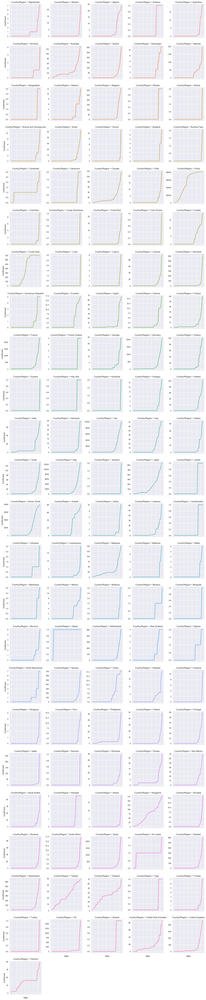

In [131]:
temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum()
temp = temp.reset_index().sort_values(by=['Date','Country/Region'])

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col='Country/Region', hue='Country/Region',
                 sharey=False, col_wrap=5)
g = g.map(plt.plot, 'Date', 'Confirmed')
g.set_xticklabels(rotation=90)
plt.show()

### New cases

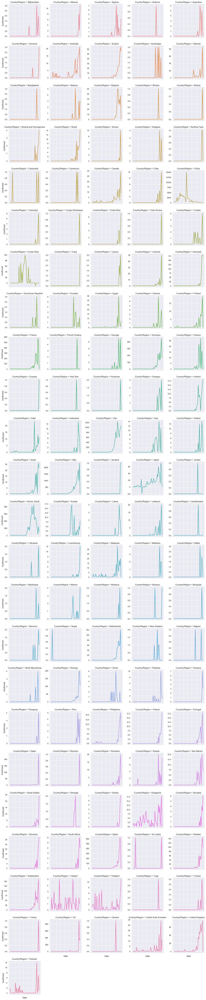

In [132]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed','Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths']= np.nan
temp.loc[mask, 'Recovered'] = np.nan

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col='Country/Region', hue='Country/Region', sharey=False, col_wrap=5)
g = g.map(sns.lineplot, 'Date', 'Confirmed')
g.set_xticklabels(rotation=90)
plt.show()

***

# Calender Map

### Number of new cases everyday

AttributeError: 'DataFrame' object has no attribute 'ix'

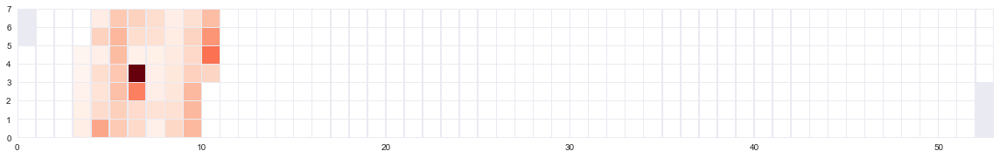

In [141]:
temp = full_table.groupby('Date')['Confirmed'].sum()
temp = temp.diff()

plt.figure(figsize=(20,5))
ax = calmap.yearplot(temp, fillcolor='white', cmap='Reds', linewidth=0.5)

### Number of new countries every day

AttributeError: 'DataFrame' object has no attribute 'ix'

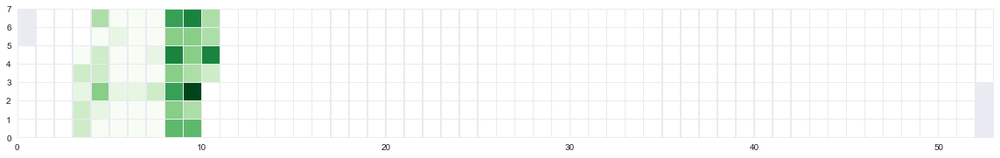

In [135]:
spread = full_table[full_table['Confirmed']!=0].groupby('Date')
spread = spread['Country/Region'].unique().apply(len).diff()

plt.figure(figsize=(20,5))
ax = calmap.yearplot(spread, fillcolor='white', cmap='Greens', linewidth=0.5)


# Comparison with other epidemics

In [137]:
epidemics = pd.DataFrame({
    'epidemic' : ['COVID-19', 'SARS', 'EBOLA', 'MERS', 'H1N1'],
    'start_year' : [2019, 2003, 2014, 2012, 2010],
    'end_year' : [2020, 2004, 2016, 2017, 2010],
    'confirmed' : [full_latest['Confirmed'].sum(), 8096, 28646, 2494, 6724149],
    'deaths' : [full_latest['Deaths'].sum(), 774, 11323, 858, 19654]
})

epidemics['mortality'] = round((epidemics['deaths']/epidemics['confirmed'])*100, 2)
epidemics

,epidemic,start_year,end_year,confirmed,deaths,mortality
0,COVID-19,2019,2020,128343,4720,3.68
1,SARS,2003,2004,8096,774,9.56
2,EBOLA,2014,2016,28646,11323,39.53
3,MERS,2012,2017,2494,858,34.40
4,H1N1,2010,2010,6724149,19654,0.29


In [138]:
temp = epidemics.melt(id_vars='epidemic', value_vars=['confirmed', 'deaths', 'mortality'],
                     var_name='Case', value_name='Value')

fig = px.bar(temp, x='epidemic', y='Value', color='epidemic', text='Value',
            facet_col='Case', color_discrete_sequence=px.colors.qualitative.Bold)
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_yaxes(showticklabels=False)
fig.layout.yaxis2.update(matches=None)
fig.layout.yaxis3.update(matches=None)
fig.show()